In [1]:
pip install datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.9/452.9 KB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.4/182.4 KB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 18.3 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


In [2]:
!pip install sentencepiece

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.8 MB/s eta 0:00:00


In [3]:
device = 'cuda:0'

In [4]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 63.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 101.4 MB/s eta 0:00:00


In [5]:
import json
import logging
import os
import re
import string
from pathlib import Path

import torch
from torch.utils.data import DataLoader, DistributedSampler, Dataset
import numpy as np
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import transformers  # noqa: E402
from transformers import AutoConfig, AutoTokenizer, HfArgumentParser  # noqa: E402

In [6]:
import requests
import tarfile

In [7]:
import sys

In [8]:
sys.path.insert(0,'/content/drive/MyDrive/mem_trans')

In [9]:
from datasets import load_dataset

In [10]:
scrolls = load_dataset("tau/scrolls", 'contract_nli')

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Dataset scrolls downloaded and prepared to /root/.cache/huggingface/datasets/tau___scrolls/contract_nli/1.0.0/672021d5d8e1edff998a6ea7a5bff35fdfd0ae243e7cf6a8c88a57a04afb46ac. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

In [11]:
class HFDataset(Dataset):
    def __init__(self, dset):
        self.dset = dset

    def __getitem__(self, idx):
        return self.dset[idx]

    def __len__(self):
        return len(self.dset)

In [12]:
scrolls_ds = HFDataset(scrolls['train'])

In [13]:
scrolls['test'][0]

{'id': '1_nda-11',
 'pid': '1_nda-11_0',
 'input': 'Receiving Party shall not reverse engineer any objects which embody Disclosing Party\'s Confidential Information.\n\nNON-DISCLOSURE AGREEMENT\nRequired under JEA\'s Confidential Information Protection Program\nTHIS NON-DISCLOSURE AGREEMENT ("Agreement") is entered into this ______day of\n__________ by and between JEA, located at 21 West Church Street, Jacksonville, Florida 32202 (the "Discloser"), and ____________________________________________________________ with an address at ______________________________________________ (the "Recipient") (hereafter Discloser and Recipient shall be referred to as the PARTIES}.\nWHEREAS, the Recipient desires to work with the discloser and/or view ______________________________________________________________________documents regarding ____________________________________ (the "Transaction"); and\nWHEREAS, the discloser is required by its internal policies, state and federal laws, rules, regulatio

In [ ]:
import pandas as pd

In [ ]:
# class HyperpartisanDataset(Dataset):
#     def __init__(self, datafile, x_field='text', label_field='label'):
#         if isinstance(datafile, str):
#             # convert str path to folder to Path
#             datafile = Path(datafile)
#         self.data = []
#         for line in datafile.open('r'):
#             self.data += [json.loads(line)]
#         self.x_field = x_field
#         self.label_field = label_field

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         x = self.data[idx][self.x_field]
#         label = self.data[idx][self.label_field]
#         return x, label

In [ ]:
# dev_dataset = HyperpartisanDataset('/content/drive/MyDrive/mem_trans/dev.jsonl')

In [ ]:
import urllib.request

In [ ]:
urllib.request.urlretrieve('https://files.deeppavlov.ai/rmt_internship/finetune/contract_nli/bert-base-cased/lr1e-05_linear_adamw_wd1e-03_968_mem25_sum_loss.tar', 'cont-bert-2segs.tar.gz')

('cont-bert-2segs.tar.gz', <http.client.HTTPMessage at 0x7f58ea8505b0>)

In [ ]:
tar = tarfile.open('cont-bert-2segs.tar.gz')
tar.extractall()
tar.close()

In [ ]:
from modeling_rmt import RMTEncoderForSequenceClassification

In [ ]:
# from transformers import AutoModelForSequenceClassification
model = RMTEncoderForSequenceClassification.from_pretrained('bert-base-cased', num_labels=3)



Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at b

In [ ]:
import sentencepiece

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/213k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/436k [00:00<?, ?B/s]

In [ ]:
params = {
    'num_mem_tokens': 25,
    'input_size': 512,
    # 'input_seg_size': args.input_seg_size,
    'model_attr': 'bert',
    # 'backbone_cls': backbone_cls,
    'bptt_depth': -1, 
    'pad_token_id': 0,
    'cls_token_id': tokenizer.cls_token_id, 
    'sep_token_id': tokenizer.sep_token_id,
    'eos_token_id': 102
}

In [ ]:
model.set_params(**params)



Setting Parameters


In [ ]:
checkpoint = torch.load('/content/lr1e-05_linear_adamw_wd1e-03_968_mem25_sum_loss/run_3/model_best.pth', map_location='cpu')

In [ ]:
model.load_state_dict(checkpoint["model_state_dict"], strict=False)

<All keys matched successfully>

In [ ]:
labels_map = {'Contradiction': 0, 'Entailment': 1, 'Not mentioned': 2}
num_labels = len(labels_map)

In [ ]:
encode_plus_kwargs = {'max_length': 968,
  'truncation': True,
  'padding': 'longest',
  'pad_to_multiple_of': 1}

In [ ]:
def collate_fn(batch):
  # cut too long strings because they may slow down tokenization
  inputs = [b['input'][:968 * 10] for b in batch]
  labels = [b['output'][:2 * 10] for b in batch]
  # if args.input_prefix:
  #   inputs = [args.input_prefix + inp for inp in inputs]
  features = tokenizer.batch_encode_plus(list(inputs), return_tensors='pt', **encode_plus_kwargs)
  labels = np.array([labels_map[t] for t in labels])
  features['labels'] = torch.from_numpy(labels)
  return features

In [ ]:
# dev_dataloader = DataLoader(dev_dataset, batch_size=1, collate_fn=collate_fn)

In [ ]:
scrolls_dataloader = DataLoader(scrolls_ds, batch_size=1,  collate_fn=collate_fn)

In [ ]:
scrolls_dataloader.__iter__().__next__()

{'input_ids': tensor([[  101, 11336, 24271,  1786,  4103,  1136,  7936,  3806,  1251,  4546,
          1134,  9712, 14637, 14856,  8867,  1158,  1786,   112,   188, 16752,
          8702, 11951,  2916,  4219,   119,   152,  6258,  1592, 18172, 11629,
          2346,  4538,  8231,  1942,   157,  2924,  2346,   118, 22751,  3663,
         18732, 28047,  9949, 11680, 21669, 12507, 12150,  3663, 16716, 24819,
          2249,   118,   141,  6258, 26351,  9025, 19556,  2036, 14731, 16941,
         15577, 11680,  1942,   113, 16972,   139,  2036,   156, 23413, 22680,
          2137,   142, 17516, 16647, 21564, 27451, 11356, 23955,  3663,   157,
          3048, 21564,  2591,  2349,  3048,  7462, 15969,  2249,  2346, 12152,
         18172,   153, 10783, 22169,  9565,  2107,   114,  1188, 16752,  8702,
         11951,  2916,  1785,  1105,  7922,   118, 14856, 26073, 11225,   113,
          1303,  2983, 20962,  2752,  1106,  1112,  1103,   789, 11225,   790,
           114,  5422,   795,   795,  

In [ ]:
from tqdm import tqdm

In [ ]:
scrolls_dataloader.__iter__().__next__()

{'input_ids': tensor([[  101, 11336, 24271,  1786,  4103,  1136,  7936,  3806,  1251,  4546,
          1134,  9712, 14637, 14856,  8867,  1158,  1786,   112,   188, 16752,
          8702, 11951,  2916,  4219,   119,   152,  6258,  1592, 18172, 11629,
          2346,  4538,  8231,  1942,   157,  2924,  2346,   118, 22751,  3663,
         18732, 28047,  9949, 11680, 21669, 12507, 12150,  3663, 16716, 24819,
          2249,   118,   141,  6258, 26351,  9025, 19556,  2036, 14731, 16941,
         15577, 11680,  1942,   113, 16972,   139,  2036,   156, 23413, 22680,
          2137,   142, 17516, 16647, 21564, 27451, 11356, 23955,  3663,   157,
          3048, 21564,  2591,  2349,  3048,  7462, 15969,  2249,  2346, 12152,
         18172,   153, 10783, 22169,  9565,  2107,   114,  1188, 16752,  8702,
         11951,  2916,  1785,  1105,  7922,   118, 14856, 26073, 11225,   113,
          1303,  2983, 20962,  2752,  1106,  1112,  1103,   789, 11225,   790,
           114,  5422,   795,   795,  

In [ ]:
def collect_nli_data(
    model,
    dataloader,
    nli_data_folder,
    nli_target_file,
    mem_size):
  if not os.path.exists(nli_data_folder):
      os.mkdir(nli_data_folder)
  target = []
  for seg in range(2):
      if not os.path.exists(os.path.join(nli_data_folder, str(f'seg{seg}'))):
        os.mkdir(os.path.join(nli_data_folder, str(f'seg{seg}')))
      for layer in range(12):
        if not os.path.exists(os.path.join(nli_data_folder, str(f'seg{seg}/layer{layer}'))):
          os.mkdir(os.path.join(nli_data_folder, str(f'seg{seg}/layer{layer}')))
  for i, batch in enumerate(tqdm(dataloader)):
    batch.to(device)
    outputs = model(return_dict=True, output_attentions=True,  **batch)
    pred = int(torch.argmax(torch.nn.functional.softmax(outputs[-1].logits, dim=-1)))
    target.append(3 * pred + int(batch['labels']))
    for seg in range( 2):
      for layer in range(12):
        for token in range(0, mem_size+2):
          data =pd.DataFrame(outputs[seg]['hidden_states'][layer+1].detach().cpu().squeeze().numpy()[token,:].reshape(1, -1))
          head_path = os.path.join(nli_data_folder, str(f'seg{seg}/layer{layer}'), str(f'token{token}.csv'))
          data.to_csv(head_path, mode='a', header=not os.path.exists(head_path))
  pd.DataFrame(target, columns=['target']).to_csv(nli_target_file)

In [ ]:
model.to(device)

In [ ]:
collect_nli_data(model, scrolls_dataloader, 'nli__tr_data', 'nli_tr_target', 25)


 40%|███▉      | 2841/7191 [1:40:05<2:31:48,  2.09s/it]

In [ ]:
model.eval()
res = []
batch_ids = []
for i, batch in enumerate(tqdm(scrolls_dataloader)):
  if i == 2:
    batch.to(device)
    # print(batch['input_ids'].shape, batch['labels'])
    outputs = model(return_dict=True, output_attentions=True,  **batch)
    batch_ids.append(batch['input_ids'])
    res.append(outputs)
    # res.append((i, batch['labels'], torch.argmax(torch.nn.functional.softmax(outputs[-1].logits, dim=-1))))
  # res.append({
  #             'map': outputs[-1]['attentions'][11][0][7].detach().squeeze().numpy()[:12, :12],
  #             'len': len(outputs),
  #             'true_label': batch['labels'],
  #             'pred_label': torch.argmax(torch.nn.functional.softmax(outputs[-1].logits, dim=-1))})



100%|██████████| 1037/1037 [00:07<00:00, 137.63it/s]


In [ ]:
res[0][1]['hidden_states'][-1].shape

torch.Size([1, 512, 768])

In [ ]:
import shutil

In [ ]:
shutil.rmtree('/content/nli_data')

In [ ]:
shutil.make_archive('nli_hid_data', 'zip', '/content/nli_data')

'/content/nli_hid_data.zip'

In [ ]:
print('TP:', sum(i['true_label'] == i['pred_label'] == 1 for i in res))
print('TN:', sum(i['true_label'] == i['pred_label'] == 0 for i in res))
print('FP:', sum(i['true_label'] == 0 and i['pred_label'] == 1 for i in res))
print('FN:', sum(i['true_label'] == 1 and  i['pred_label'] == 0 for i in res))

TP: tensor([21])
TN: tensor([36])
FP: tensor([2])
FN: tensor([5])


In [ ]:
def labeling(true_val, pred_val):
  res = ''
  if true_val == pred_val:
    res += 'T'
  else:
    res += 'F'
  if pred_val == 0:
    res += 'N'
  else:
    res += 'P'
  return res
  

In [ ]:
res = [{'map': ex[map][:12, :12],
    'len': ex['len'],
    'true_label': ex['true_label'],
    'pred_label': ex['pred_label']}for ex in res]

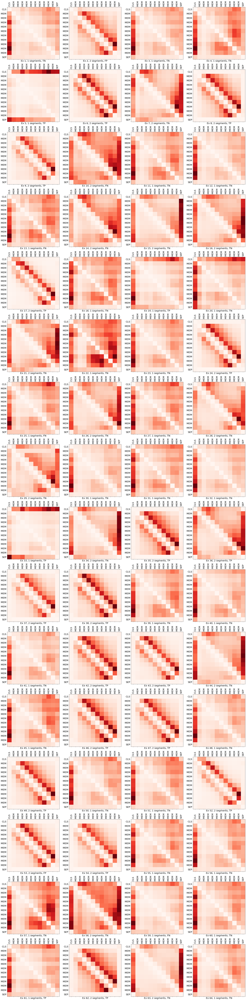

In [ ]:
fig = plt.figure(figsize=(30, 120))
cur_tokens = ['CLS'] + ['MEM'] * 10 + ['SEP']
for i, ex in enumerate(res):
  ax = fig.add_subplot(16, 4, i+1)
  ax.matshow(ex['map'], cmap='Reds')
  fontdict = {'fontsize': 20}
  ax.set_xticks(range(len(cur_tokens)))
  ax.set_yticks(range(len(cur_tokens)))
  ax.set_yticklabels(cur_tokens, fontdict=fontdict)
  ax.set_xticklabels(cur_tokens, fontdict=fontdict, rotation=90)
  ax.set_xlabel(f'''Ex {i+1}, {ex['len']} segments, {labeling(ex['true_label'], ex['pred_label'])}''', fontdict)    
plt.tight_layout()
plt.show()

In [ ]:
import pickle

In [ ]:
with open('/content/drive/MyDrive/mem_trans/contract_nli_2410.pkl', 'wb') as f:
  pickle.dump(res, f)
with open('/content/drive/MyDrive/mem_trans/contract_nli_2410_toks.pkl', 'wb') as f:
  pickle.dump(batch_ids, f)

In [ ]:
with open('/content/drive/MyDrive/mem_trans/hyp_1_batch_ids.pkl', 'wb') as f:
  pickle.dump(batch_ids, f)

In [ ]:
with open('/content/drive/MyDrive/mem_trans/hyp_1_samples.pkl', 'wb') as f:
  pickle.dump(res, f)

UnsupportedOperation: ignored

In [ ]:
!mv /content/nli_hid_data.zip /content/drive/MyDrive/mem_trans

In [ ]:
def plot_mem_part(attentions, segment, layer, mem_size):
  def _plotting(fig, coords, area, tokens, label):
    ax = fig.add_subplot(12, 4, coords)
    ax.matshow(area, cmap='Reds')
    fontdict = {'fontsize': 20}
    ax.set_xticks(range(len(tokens)))
    ax.set_yticks(range(len(tokens)))
    ax.set_yticklabels(tokens, fontdict=fontdict)
    ax.set_xticklabels(tokens, fontdict=fontdict, rotation=90)
    ax.set_xlabel(label, fontdict)

  fig = plt.figure(figsize=(30, 90))
  attention = [i[layer] for i in attentions]
  print(len(attention))
  cur_tokens = ['CLS'] + ['MEM'] * mem_size + ['SEP']
  for head in range(attention[0].shape[0]):
    for i in range(4):
      _plotting(fig, head*4 + i + 1, attention[i][head][0:mem_size+2, 0:mem_size+2], cur_tokens, f'''Ex {'pos' * int(i < 2) + 'neg' * int(i > 1)}{i % 2 + 1}, segment {segment}, layer {layer}, head {head}''')

    
  plt.tight_layout()
  plt.show()

In [ ]:
def plot_attention_area(attentions, tokens, segment, layer, x_interval, y_interval, mem_size):
  fig = plt.figure(figsize=(30, 90))
  attention = attentions[layer]
  print(attention.shape)
  for head in range(attention.shape[0]):
    ax = fig.add_subplot(6, 2, head+1)
    
    ax.matshow(attention[head][x_interval[0]:x_interval[1], y_interval[0]:y_interval[1]], cmap='Reds')

    fontdict = {'fontsize': 20}
    eff_range = 512 - mem_size

    res = (len(tokens) - 2) % eff_range
    cur_tokens = ['CLS'] + ['MEM'] * mem_size + ['SEP'] + tokens[1:-1][(segment > 0) * (res + eff_range * (segment - 1)) : res + (segment) * eff_range] + ['SEP']
    cur_tokens = [str(i) + ' ' + cur_tokens[i] for i in range(len(cur_tokens))]
    ax.set_xticks(range(x_interval[1] - x_interval[0]))
    ax.set_yticks(range(y_interval[1] - y_interval[0]))
    ax.set_yticklabels(cur_tokens[y_interval[0]:y_interval[1]], fontdict=fontdict)
    ax.set_xticklabels(cur_tokens[x_interval[0]:x_interval[1]], fontdict=fontdict, rotation=90)

    ax.set_xlabel(f'Segment {segment}, layer {layer}, head {head}', fontdict)
  plt.tight_layout()
  plt.show()

In [ ]:
def find_stripes_simple(attentions, tokens, layer, head):
  att_map = attentions[layer][head-1]
  sums = np.sum(att_map, axis=0) / len(tokens)
  threshold = np.sum(att_map) / len(tokens) ** 2
  sums = np.max(np.vstack((sums, [threshold] * len(sums))), axis=0)
  plt.plot(sums)
  plt.show()
  peaks = np.hstack((sums[:-1] > sums[1:], [True])) * np.hstack(([True], sums[1:] > sums[:-1]))
  imps = [tokens[i] for i in range(len(tokens)) if peaks[i]]
  return imps

In [ ]:
import numpy as np
import os

In [ ]:
import pickle
from matplotlib import pyplot as plt
import transformers  # noqa: E402
from transformers import AutoConfig, AutoTokenizer
import sentencepiece
%matplotlib inline


In [ ]:
def plot_attention_weights(attentions, tokens, segment, layer, mem_size, seq_len, y_tokens=None, p_attentions=None, filename='att.png', save=False):
    # attentions n_layers x n_heads x len x len
    fig = plt.figure(figsize=(120, 120))
    if y_tokens is None:
        y_tokens = tokens
        fig = plt.figure(figsize=(120, 360))

    attention = attentions[layer]
    res = (len(y_tokens) - 2) % (seq_len - mem_size - 3)
    cur_tokens = ['CLS'] + ['MEM'] * mem_size + ['SEP'] + y_tokens[1:-1][(segment > 0) * (res + (seq_len - mem_size - 3) * (segment - 1)) : res + (segment) * (seq_len - mem_size - 3)] + ['SEP']
    cur_tokens = [str(i) + ' ' + cur_tokens[i] for i in range(len(cur_tokens))]
    if p_attentions:
        p_attention = p_attentions[layer]

    for head in range(attention.shape[0]):
        ax = fig.add_subplot(6, 2, head+1)

        # plot the attention weights
        if p_attentions:
            att = np.concatenate([np.expand_dims(p_attention[head], axis=0), attention[head]], axis=0)
            ax.matshow(att[:len(y_tokens)+1,:len(tokens)], cmap='Reds')
        else:
            ax.matshow(attention[head][:len(cur_tokens),:len(cur_tokens)], cmap='Reds')

        fontdict = {'fontsize': 10}

        ax.set_xticks(range(len(cur_tokens)))
        if p_attentions:
            ax.set_yticks(range(len(y_tokens) + 1))
            ax.set_yticklabels(['[P]'] + y_tokens, fontdict)
        else:
            ax.set_yticks(range(len(cur_tokens)))
            ax.set_yticklabels(cur_tokens, fontdict)

        ax.set_xticklabels(cur_tokens,fontdict=fontdict, rotation=90)

        ax.set_xlabel('Head {}'.format(head+1), fontdict)

    plt.tight_layout()
    if save:
        plt.savefig(filename)
    # plt.show()

In [ ]:
# with open("/content/drive/MyDrive/mem_trans/hyp_1_samples.pkl", 'rb') as f:
#   res_pos = pickle.load(f)

In [ ]:
# with open("/content/drive/MyDrive/mem_trans/hyp_1_batch_ids.pkl", 'rb') as f:
#   batch_ids = pickle.load(f)

In [ ]:
with open('/content/drive/MyDrive/mem_trans/contract_nli_05.pkl', 'rb') as f:
  res = pickle.load(f)
with open('/content/drive/MyDrive/mem_trans/contract_nli_05_toks.pkl', 'rb') as f:
  batch_ids = pickle.load(f)

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')

In [ ]:
def get_actual_seq_len(tokens):
    if '[PAD]' in tokens:
        return tokens.index('[PAD]')
    return len(tokens)

In [ ]:
len(res[2][1]['attentions'])

12

In [ ]:
for i in range(2, 3):
  seg_start = 0
  if i == 2:
    seg_start= 1
  outputs = res[i]
  if not os.path.isdir(f'''ex{i}'''):
    os.mkdir(f'''ex{i}''')
  tokens = [tokenizer.convert_ids_to_tokens(t_id).replace('▁', '') for t_id in batch_ids[i][0].tolist()]
  tokens = tokens[:get_actual_seq_len(tokens)]
  for seg in range(seg_start, 2):
    layer_start = 0
    if seg == 1:
      layer_start = 8
    if not os.path.isdir(f'''ex{i}/seg{seg}'''):
      os.mkdir(f'''ex{i}/seg{seg}''')
    for layer in range(layer_start, len(outputs[seg]['attentions'])):
      # attentions = [[layer_atts.detach().squeeze().numpy() for layer_atts in output[seg]['attentions']] for output in outputs]
      # plot_mem_part(attentions, segment=seg, layer=layer, mem_size=10)
      print(f'example {i}, segment: {seg}, layer: {layer}')
      if isinstance(outputs[seg]['attentions'][0], tuple):
          attentions = [layer_atts[0].detach().squeeze().numpy() if layer_atts[0] is not None else None for layer_atts in outputs[seg]['attentions']]
          # cd_attentions = [layer_atts[1].detach().squeeze().numpy() for layer_atts in outputs[1]['attentions']]
          # p_attentions = [layer_atts[2].detach().squeeze().numpy() for layer_atts in outputs[1]['attentions']]
      else:
          p_attentions = None
          attentions = [layer_atts.detach().squeeze().numpy() for layer_atts in outputs[seg]['attentions']]
      if attentions[0] is not None:
          # has regular attention heads
          print(f'att_heads:')
          print(attentions[0].shape)
          plot_attention_weights(attentions, tokens=tokens, layer=layer, segment = seg, mem_size=25, seq_len=512, y_tokens=None, p_attentions=None, filename=f'ex{i}/seg{seg}/layer{layer}.pdf', save=True)
      # if p_attentions:
      #     print(f'cdq att heads:')
      #     plot_attention_weights(cd_attentions, tokens=tokens, layer=layer, y_tokens=None, p_attentions=p_attentions)

example 2, segment: 1, layer: 8
att_heads:
(12, 512, 512)
example 2, segment: 1, layer: 9
att_heads:
(12, 512, 512)
example 2, segment: 1, layer: 10
att_heads:
(12, 512, 512)
example 2, segment: 1, layer: 11
att_heads:
(12, 512, 512)


<Figure size 8640x8640 with 0 Axes>

<Figure size 8640x8640 with 0 Axes>

<Figure size 8640x8640 with 0 Axes>

Error in callback <function flush_figures at 0x7fbc86c57f80> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
!zip -r /content/cnli_ex2_seg1.zip /content/ex2/seg1

updating: content/ex2/seg1/ (stored 0%)
updating: content/ex2/seg1/layer4.pdf (deflated 28%)
updating: content/ex2/seg1/layer9.pdf (deflated 30%)
updating: content/ex2/seg1/layer10.pdf (deflated 27%)
updating: content/ex2/seg1/layer3.pdf (deflated 28%)
updating: content/ex2/seg1/layer8.pdf (deflated 29%)
updating: content/ex2/seg1/layer2.pdf (deflated 24%)
updating: content/ex2/seg1/layer5.pdf (deflated 35%)
updating: content/ex2/seg1/layer0.pdf (deflated 16%)
updating: content/ex2/seg1/layer1.pdf (deflated 31%)
updating: content/ex2/seg1/layer11.pdf (deflated 28%)
updating: content/ex2/seg1/layer6.pdf (deflated 35%)
updating: content/ex2/seg1/layer7.pdf (deflated 34%)


In [ ]:
from google.colab import files
files.download("/content/cnli_ex0_seg1.zip")
files.download("/content/cnli_ex1_seg0.zip")
files.download("/content/cnli_ex1_seg1.zip")
files.download("/content/cnli_ex2_seg0.zip")
files.download("/content/cnli_ex2_seg1.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
 from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
strs = [str(f"/content/ex0seg0layer{i}.pdf") for i in range(1, 12)]

In [ ]:
import shutil

In [ ]:
for string in strs:
  shutil.move(string, "/content/deb_fail/")

In [ ]:
with open('/content/ex0seg0layer0.pdf', 'r') as f:
  print('well')

FileNotFoundError: ignored

In [ ]:
!mkdir deb_fail

In [ ]:
pos_data_1 = []
neg_data_1 = []
pos_data_2 = []
neg_data_2 = []
with open('/content/drive/MyDrive/mem_trans/test.jsonl', 'r') as f:
  for line in f.readlines():
    samp = json.loads(line)
    art  = tokenizer(samp['text'])
    res = len(art['input_ids'][1:-1]) % 499
    full = len(art['input_ids'][1:-1]) // 499
    if full > 0:
      if full == 1:
        seg1 = tokenizer.decode(art['input_ids'][1:-1][:res])
        seg2 = tokenizer.decode(art['input_ids'][1:-1][res:res + 499])
      else:
        seg1 = tokenizer.decode(art['input_ids'][1:-1][:499])
        seg2 = tokenizer.decode(art['input_ids'][1:-1][499:998])
      if samp['label'] == 'true':
        pos_data_1.append({"text": seg1, "label": "true", "id": samp['id']})
        pos_data_2.append({"text": seg2, "label": "true", "id": samp['id']})
      else:
        neg_data_1.append({"text": seg1, "label": "false", "id": samp['id']})
        neg_data_2.append({"text": seg2, "label": "false", "id": samp['id']})

In [ ]:
!pip install jsonlines

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import jsonlines

In [ ]:
with jsonlines.open("/content/drive/MyDrive/mem_trans/pos_data_1.jsonl", 'w') as writer:
  writer.write_all(pos_data_1)
with jsonlines.open("/content/drive/MyDrive/mem_trans/pos_data_2.jsonl", 'w') as writer:
  writer.write_all(pos_data_2)
with jsonlines.open("/content/drive/MyDrive/mem_trans/neg_data_1.jsonl", 'w') as writer:
  writer.write_all(neg_data_1)
with jsonlines.open("/content/drive/MyDrive/mem_trans/neg_data_2.jsonl", 'w') as writer:
  writer.write_all(neg_data_2)

In [ ]:
y = tokenizer(list(neg_data.values()))

NameError: ignored

In [ ]:
x = tokenizer(list(pos_data.values()))

In [ ]:
len(y['input_ids'])

38

In [ ]:
seg_1 = [tokenizer.decode(i[1:500]) for i in x['input_ids']]
seg_2 = [tokenizer.decode(i[501:999]) for i in x['input_ids']]

In [ ]:
with open('/content/drive/MyDrive/mem_trans/seg_1_pos.txt', 'w') as f:
  f.write('\n\n'.join(seg_1))
with open('/content/drive/MyDrive/mem_trans/seg_2_pos.txt', 'w') as f:
  f.write('\n\n'.join(seg_2))

In [ ]:
pos_dataset_1 = HyperpartisanDataset('/content/drive/MyDrive/mem_trans/pos_data_1.jsonl')
pos_dataset_2 = HyperpartisanDataset('/content/drive/MyDrive/mem_trans/pos_data_2.jsonl')

In [ ]:
urllib.request.urlretrieve('https://files.deeppavlov.ai/rmt_internship/finetune/hyperpartisan_news_detection/microsoft/deberta-v3-base/lr5e-05_linear_adamw_wd1e-03_512.tar.gz', 'deberta.tar.gz')

('deberta.tar.gz', <http.client.HTTPMessage at 0x7f284e36e250>)

In [ ]:
tar = tarfile.open('deberta.tar.gz')
tar.extractall()
tar.close()

In [ ]:
from transformers import AutoModelForSequenceClassification

In [ ]:
base_model = AutoModelForSequenceClassification.from_pretrained("microsoft/deberta-v3-base")

Some weights of the model checkpoint at microsoft/deberta-v3-base were not used when initializing DebertaV2ForSequenceClassification: ['lm_predictions.lm_head.LayerNorm.bias', 'lm_predictions.lm_head.dense.weight', 'mask_predictions.LayerNorm.weight', 'mask_predictions.classifier.bias', 'mask_predictions.classifier.weight', 'mask_predictions.dense.bias', 'lm_predictions.lm_head.LayerNorm.weight', 'lm_predictions.lm_head.dense.bias', 'mask_predictions.dense.weight', 'mask_predictions.LayerNorm.bias', 'lm_predictions.lm_head.bias']
- This IS expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DebertaV2ForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a

In [ ]:
pos_data_1

[{'text': 'In his election campaign, Mr Trump was clear about his desire to build a "',
  'label': 'true',
  'id': 459},
 {'text': 'Methinks she doth protest too much -- and too late. Those who condemned President Trump for not condemning white supremacist groups quickly and forcefully enough after Charlottesville have no problem with Hillary Clinton taking five full days to hypocritically condemn sexual predator Harvey Weinstein. Maybe she was pondering the similarities between Weinstein’s predatory activities and that of her husband. Both used their positions of power to extort sexual favors, sometimes forcibly, from women. And just as Hollywood looked the other way for the sake of career advancement so too did Hillary Clinton as she rode her husband’s attained coattails to political prominence. So her recent expression of disgust over Weinstein’s activities ring hollow: At long last, the people who do the strategic planning for Hillary Clinton and tell her what emotions she should i

In [ ]:
checkpoint = torch.load('/content/lr5e-05_linear_adamw_wd1e-03_512/run_4/model_best.pth', map_location='cpu')

In [ ]:
base_model.load_state_dict(checkpoint["model_state_dict"], strict=False)

<All keys matched successfully>

In [ ]:
from tqdm import tqdm

In [ ]:
base_model.eval()
res = []
batch_ids = []
for i, batch in enumerate (tqdm(test_dataloader)):
  # batch_ids.append(batch['input_ids'])
  if i >= 0:
    outputs = base_model(**batch)
    res.append(torch.argmax(torch.nn.functional.softmax(outputs.logits, dim=-1)) == batch['labels'])
    if i % 5 == 4:
      print(res[-5:])

  8%|▊         | 5/65 [00:17<04:11,  4.19s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 15%|█▌        | 10/65 [00:36<03:31,  3.85s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([False])]


 23%|██▎       | 15/65 [00:51<02:26,  2.92s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 31%|███       | 20/65 [01:05<01:57,  2.61s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 38%|███▊      | 25/65 [01:19<01:47,  2.68s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 46%|████▌     | 30/65 [01:32<01:46,  3.04s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([False])]


 54%|█████▍    | 35/65 [01:51<02:14,  4.47s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([False])]


 62%|██████▏   | 40/65 [02:11<01:24,  3.38s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 69%|██████▉   | 45/65 [02:28<01:01,  3.09s/it]

[tensor([True]), tensor([True]), tensor([False]), tensor([True]), tensor([True])]


 77%|███████▋  | 50/65 [02:49<00:52,  3.50s/it]

[tensor([False]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 85%|████████▍ | 55/65 [03:04<00:36,  3.66s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


 92%|█████████▏| 60/65 [03:31<00:24,  4.93s/it]

[tensor([False]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


100%|██████████| 65/65 [03:54<00:00,  3.61s/it]

[tensor([True]), tensor([True]), tensor([True]), tensor([True]), tensor([True])]


In [ ]:
[i+1 for i in range(len(res)) if not res[i]]

[10, 30, 35, 43, 46, 56]

In [ ]:
pos_dataloader_1 = DataLoader(pos_dataset_1, batch_size=1, collate_fn=collate_fn)
pos_dataloader_2 = DataLoader(pos_dataset_2, batch_size=1, collate_fn=collate_fn)

In [ ]:
base_model.eval()
res = []
ind = -1
for i, (batch1, batch2) in enumerate (tqdm(zip(pos_dataloader_1, pos_dataloader_2))):
  ind += 2
  outputs1 = base_model(return_dict=True, output_attentions=True,  **batch1)
  outputs2 = base_model(return_dict=True, output_attentions=True,  **batch2)
  pred1 = torch.argmax(torch.nn.functional.softmax(outputs1.logits, dim=-1))
  pred2 = torch.argmax(torch.nn.functional.softmax(outputs2.logits, dim=-1))
  print(f'''\nExample No {ind} in pos_data:\nBeginning: {tokenizer.decode(batch1['input_ids'].squeeze()[:20])} \nPredicted label 1: {int(bool(pred1))}, predicted label 2: {int(bool(pred2))}\n''')

1it [00:07,  7.64s/it]


Example No 1 in pos_data:
Beginning: [CLS] In his election campaign, Mr Trump was clear about his desire to build a "[SEP] 
Predicted label 1: 1, predicted label 2: 0



2it [00:21, 11.25s/it]


Example No 3 in pos_data:
Beginning: [CLS] Methinks she doth protest too much -- and too late. Those who condemned President 
Predicted label 1: 1, predicted label 2: 1



3it [00:30, 10.45s/it]


Example No 5 in pos_data:
Beginning: [CLS] The State Department argued at a federal hearing Thursday that its ability to process the 100,0 Hillary 
Predicted label 1: 0, predicted label 2: 0



4it [00:42, 11.06s/it]


Example No 7 in pos_data:
Beginning: [CLS] Credit: HealthNutNews Recently, Erin Elizabeth from HealthNutNews wrote up an expose about the 
Predicted label 1: 1, predicted label 2: 1



5it [00:52, 10.66s/it]


Example No 9 in pos_data:
Beginning: [CLS] Oct 19, 2017 at 3:09 PM From Washington, D.C. to the NFL 
Predicted label 1: 1, predicted label 2: 1



6it [01:04, 11.10s/it]


Example No 11 in pos_data:
Beginning: [CLS] If You Vote For Trump, Then Screw You Drew Magary wants a word with anyone who' 
Predicted label 1: 1, predicted label 2: 1



7it [01:11,  9.81s/it]


Example No 13 in pos_data:
Beginning: [CLS] Image via Getty UPDATED 10/18/17, 2:45 p.m. ET: 
Predicted label 1: 0, predicted label 2: 1



8it [01:20,  9.32s/it]


Example No 15 in pos_data:
Beginning: [CLS] Usher ILOSM family the situation between Usher and his STD accuser, Quantasia Sharpton, has just 
Predicted label 1: 1, predicted label 2: 1



9it [01:32, 10.17s/it]


Example No 17 in pos_data:
Beginning: [CLS] Here’s one thing we can all say for certain regarding the latest twist of the Hillary Clinton 
Predicted label 1: 1, predicted label 2: 1



10it [01:44, 10.77s/it]


Example No 19 in pos_data:
Beginning: [CLS] Image via South Park is one of television's longest-running shows, a 20-season 
Predicted label 1: 1, predicted label 2: 1



11it [01:56, 11.13s/it]


Example No 21 in pos_data:
Beginning: [CLS] There was a break-in at Stephen Paddock’s Reno home on Sunday. Local police say 
Predicted label 1: 0, predicted label 2: 0



12it [02:08, 11.37s/it]


Example No 23 in pos_data:
Beginning: [CLS] The world Is watching and so is oil as the death toll rises in the streets of 
Predicted label 1: 1, predicted label 2: 1



13it [02:20, 11.56s/it]


Example No 25 in pos_data:
Beginning: [CLS] Trump Jr. allowed Tuesday night in an interview with Sean Hannity of Fox News Channel that "he 
Predicted label 1: 1, predicted label 2: 0



14it [02:30, 11.22s/it]


Example No 27 in pos_data:
Beginning: [CLS] Some time back it was reported that an alert Maryland police officer saw an Islamic woman in an SUV 
Predicted label 1: 1, predicted label 2: 1



15it [02:39, 10.35s/it]


Example No 29 in pos_data:
Beginning: [CLS] President Trump holds a joint press conference with Sheikh Sabah Al Ahmad Al Sabah of Kuwait. Trump holds 
Predicted label 1: 0, predicted label 2: 0



16it [02:47,  9.65s/it]


Example No 31 in pos_data:
Beginning: [CLS] With most rational individuals condemning Kathy Griffin’s reprehensible photoshoot, some dark souls are coming out of 
Predicted label 1: 1, predicted label 2: 1



17it [02:57,  9.92s/it]


Example No 33 in pos_data:
Beginning: [CLS] Let’s face facts: Our president holds racist views. Opinion Donald Trump’s words hit 
Predicted label 1: 1, predicted label 2: 1



18it [03:08, 10.10s/it]


Example No 35 in pos_data:
Beginning: [CLS] The German public have, as predicted, kept ahold of nurse. But it is the breakthrough 
Predicted label 1: 1, predicted label 2: 1



19it [03:18, 10.33s/it]


Example No 37 in pos_data:
Beginning: [CLS] This past weekend, Americans watched in shock as “alt-right” members, neo-Nazis 
Predicted label 1: 1, predicted label 2: 1



20it [03:30, 10.70s/it]


Example No 39 in pos_data:
Beginning: [CLS] We have made great strides in the policing of thought in this country. Just ask Brendan Eich, 
Predicted label 1: 1, predicted label 2: 1



21it [03:39, 10.03s/it]


Example No 41 in pos_data:
Beginning: [CLS] A remarkable thing happened recently. You might have missed it, because while it happened in plain sight 
Predicted label 1: 1, predicted label 2: 1



22it [03:50, 10.48s/it]


Example No 43 in pos_data:
Beginning: [CLS] Illegal aliens, paid Soros protesters, angry Black Lives Matter terrorists inspired by Obama’s race war 
Predicted label 1: 1, predicted label 2: 1



In [ ]:
outputs1.attentions[0].shape

torch.Size([1, 12, 501, 501])

In [ ]:
len(res[0][0]['attentions'][0])

1

In [ ]:
!du -h .

8.0K	./.config/configurations
64K	./.config/logs/2022.08.15
68K	./.config/logs
100K	./.config
30M	./drive/MyDrive/Colab Notebooks
4.0K	./drive/MyDrive/Classroom/ПиЛД
28K	./drive/MyDrive/Classroom/Формальная и экспериментальная прагматика 2022
36K	./drive/MyDrive/Classroom
118M	./drive/MyDrive/2020-10-10 14.47.16 Консультация по дискретке 75561965408
125M	./drive/MyDrive/2020-10-10 15.27.08 Консультация по дискретке 75561965408
4.0K	./drive/MyDrive/Самостоятельная_работа_1_курс_11.10
4.0K	./drive/MyDrive/course_models
4.0K	./drive/MyDrive/2022
4.0K	./drive/MyDrive/.ipynb_checkpoints
42K	./drive/MyDrive/rresult
4.0K	./drive/MyDrive/hse-intro-ds-2022-hw2.zip (Unzipped Files)
11K	./drive/MyDrive/mem_trans/__pycache__
4.0K	./drive/MyDrive/mem_trans/.ipynb_checkpoints
985M	./drive/MyDrive/mem_trans
4.9G	./drive/MyDrive
4.0K	./drive/.file-revisions-by-id
4.0K	./drive/.shortcut-targets-by-id
4.0K	./drive/.Trash-0/files
4.0K	./drive/.Trash-0/info
12K	./drive/.Trash-0
4.9G	./drive
2.1G	./lr1e-05

In [ ]:
git status

SyntaxError: ignored

In [ ]:
import os

In [ ]:
import pandas as pd

In [ ]:
a = pd.DataFrame([5,6,7,8])

In [ ]:
c = pd.DataFrame([8, 7, 6, 5], columns = ['qwert'])

In [ ]:

a.to_csv('/content/a.csv', mode='a', header=not os.path.exists('/content/a.csv'))
c.to_csv('/content/a.csv', mode='a', header=not os.path.exists('/content/a.csv'))

In [ ]:
b = pd.read_csv('/content/a.csv')
b

,Unnamed: 0,0,1,2,3
0,0,5,6,7,8
1,0,5,6,7,8


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import pandas as pd

In [ ]:
train_set = pd.read_csv('/content/head11.csv').drop(columns=['Unnamed: 0'])

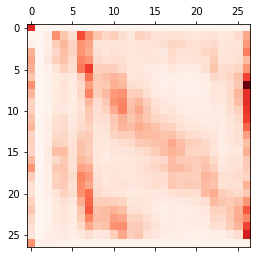

In [ ]:
plt.matshow(np.array(train_set.iloc[4]).reshape((27, 27)), cmap='Reds')